In [2]:
import warnings

import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc as pm
import seaborn as sns

from matplotlib import gridspec
from scipy import sparse, special, stats
from pytensor import tensor as tt

%config InlineBackend.figure_format = 'retina'
warnings.simplefilter(action="ignore", category=FutureWarning)
RANDOM_SEED = 8927
np.random.seed(286)

In [3]:
az.style.use("arviz-darkgrid")

# Chapter 3 - Inferences with binomials
## 3.1 Inferring a rate


Inferring the rate $\theta$ of a binary process  
$$ \theta \sim \text{Beta}(1, 1)  $$
$$ k \sim \text{Binomial} ( \theta, n)  $$

In the example, we set k = 5 and n = 10

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [theta]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 25 seconds.


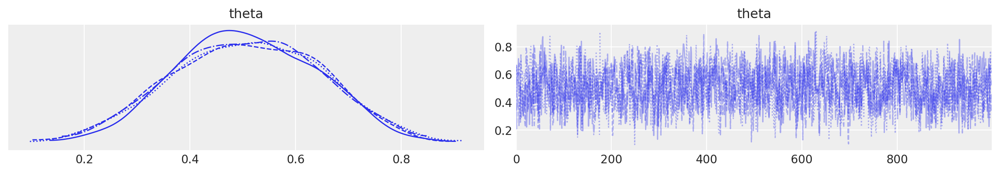

In [10]:
# Data
k = np.array([5])
n = np.array([10])

with pm.Model() as model1:
    # prior
    theta = pm.Beta("theta", alpha=1, beta=1)
    # observed
    x = pm.Binomial("x", n=n, p=theta, observed=k)
    # inference
    trace1 = pm.sample()

# idata1 = az.from_pymc3(trace1)
az.plot_trace(trace1, var_names=["theta"]);

And generate a picture that is identical to 3.2 one on page 39 of Wagenmakers, 2013:

/var/folders/6y/fdf8wk_52jl4c5d2bnv27j240000gn/T/ipykernel_7711/2350866509.py:9: UserWarning: The figure layout has changed to tight
  plt.tight_layout();


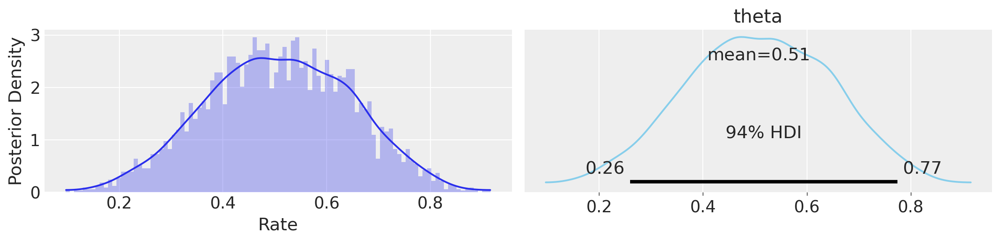

In [58]:
_, axes = plt.subplots(1, 2, figsize=(12, 3))

az.plot_kde(np.array(trace1.posterior["theta"]).flatten(), ax=axes[0])
axes[0].hist(np.array(trace1.posterior["theta"]).flatten(), bins=100, density=1, alpha=0.3)
axes[0].set_xlabel("Rate")
axes[0].set_ylabel("Posterior Density")

az.plot_posterior(trace1, var_names=["theta"], ax=axes[1], color="#87ceeb")
plt.tight_layout();

In [57]:
az.summary(
    trace1, var_names=["theta"], round_to=3
)  # gives the same credible interval as in the book.

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
theta,0.508,0.14,0.26,0.774,0.004,0.003,1433.902,2592.779,1.001


### Exercises

#### Exercise 3.1.1

In [66]:
theta_samples = trace1.posterior["theta"].to_numpy().flatten()
theta_samples[(theta_samples > 0.4) & (theta_samples < 0.6)].shape[0] / theta_samples.shape[0]

0.4915

#### Exercise 3.1.2

About two times more likely. Below is the code for verification.

In [71]:
theta_samples[(theta_samples > 0.49) & (theta_samples < 0.51)].shape[0] / theta_samples[(theta_samples > 0.69) & (theta_samples < 0.71)].shape[0]

2.4

#### Exercise 3.1.3

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [theta]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 46 seconds.


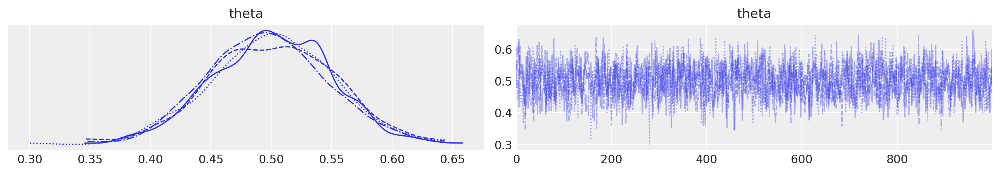

In [72]:
k = np.array([50])
n = np.array([100])

with pm.Model() as model2:
    # prior
    theta = pm.Beta("theta", alpha=1, beta=1)
    # observed
    x = pm.Binomial("x", n=n, p=theta, observed=k)
    # inference
    trace2 = pm.sample()
    
az.plot_trace(trace2, var_names=["theta"]);

/var/folders/6y/fdf8wk_52jl4c5d2bnv27j240000gn/T/ipykernel_7711/822780238.py:9: UserWarning: The figure layout has changed to tight
  plt.tight_layout();


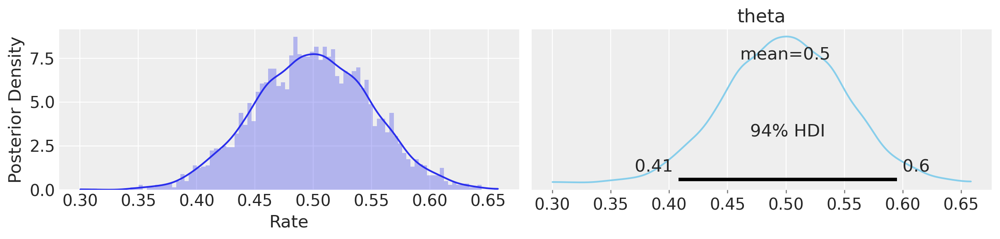

In [73]:
_, axes = plt.subplots(1, 2, figsize=(12, 3))

az.plot_kde(np.array(trace2.posterior["theta"]).flatten(), ax=axes[0])
axes[0].hist(np.array(trace2.posterior["theta"]).flatten(), bins=100, density=1, alpha=0.3)
axes[0].set_xlabel("Rate")
axes[0].set_ylabel("Posterior Density")

az.plot_posterior(trace2, var_names=["theta"], ax=axes[1], color="#87ceeb")
plt.tight_layout();

In [75]:
az.summary(
    trace2, var_names=["theta"], round_to=3
)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
theta,0.5,0.05,0.408,0.595,0.001,0.001,1727.437,2816.942,1.001


So with more trials, the posterior distribution will be more peaked around the true value of $\theta$. (More 'certain' about the true value of $\theta$).

As an evidence, we can see the 94% HDI of the posterior distribution is getting narrower as the number of trials increases. The SD also decreases from 0.14 to 0.05.

#### Exercise 3.1.4

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [theta]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 100 draw iterations (4_000 + 400 draws total) took 25 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
/var/folders/6y/fdf8wk_52jl4c5d2bnv27j240000gn/T/ipykernel_7711/995937665.py:23: UserWarning: The figure layout has changed to tight
  plt.tight_layout();


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
theta,0.493,0.135,0.27,0.754,0.013,0.009,117.414,253.431,1.014


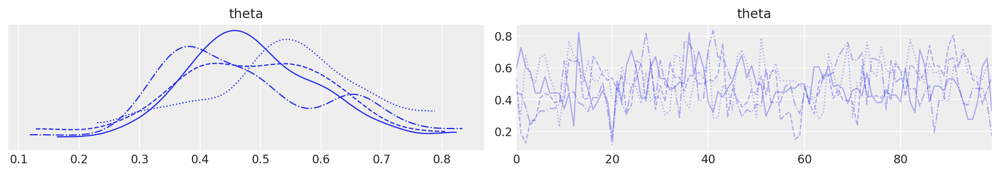

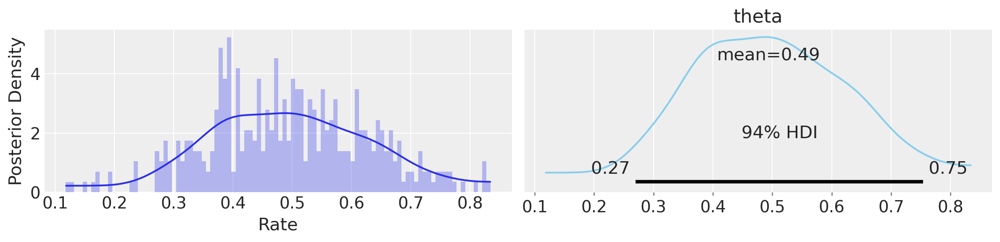

In [77]:
# run with fewer samples
k = np.array([5])
n = np.array([10])

with pm.Model() as model3:
    # prior
    theta = pm.Beta("theta", alpha=1, beta=1)
    # observed
    x = pm.Binomial("x", n=n, p=theta, observed=k)
    # inference
    trace3 = pm.sample(100) # by default, pm.sample() draws 1000 samples
    
az.plot_trace(trace3, var_names=["theta"]);

_, axes = plt.subplots(1, 2, figsize=(12, 3))

az.plot_kde(np.array(trace3.posterior["theta"]).flatten(), ax=axes[0])
axes[0].hist(np.array(trace3.posterior["theta"]).flatten(), bins=100, density=1, alpha=0.3)
axes[0].set_xlabel("Rate")
axes[0].set_ylabel("Posterior Density")

az.plot_posterior(trace3, var_names=["theta"], ax=axes[1], color="#87ceeb")
plt.tight_layout();

az.summary(
    trace3, var_names=["theta"], round_to=3
)

Changing the number of samples will not affect the width of the posterior distribution. But it will affect the quality of approximation of the posterior distribution (the more samples, the more smooth the histogram).

The width of the posterior distribution is determined by the number of trials (or the evidence observed).

#### Exercise 3.1.5

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [theta]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 24 seconds.
/var/folders/6y/fdf8wk_52jl4c5d2bnv27j240000gn/T/ipykernel_7711/3370704397.py:22: UserWarning: The figure layout has changed to tight
  plt.tight_layout();


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
theta,0.98,0.014,0.955,0.999,0.0,0.0,1228.502,1504.551,1.007


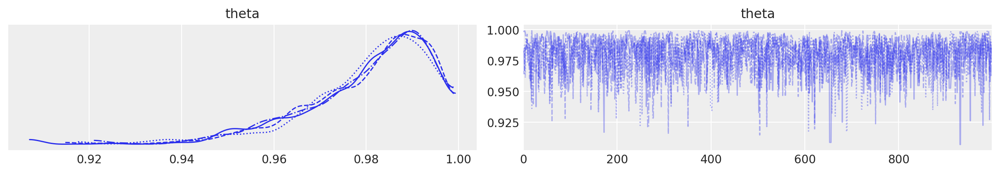

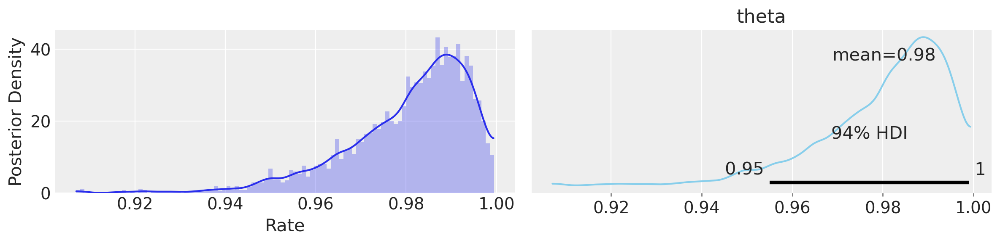

In [78]:
k = np.array([99])
n = np.array([100])

with pm.Model() as model4:
    # prior
    theta = pm.Beta("theta", alpha=1, beta=1)
    # observed
    x = pm.Binomial("x", n=n, p=theta, observed=k)
    # inference
    trace4 = pm.sample()

az.plot_trace(trace4, var_names=["theta"]);

_, axes = plt.subplots(1, 2, figsize=(12, 3))

az.plot_kde(np.array(trace4.posterior["theta"]).flatten(), ax=axes[0])
axes[0].hist(np.array(trace4.posterior["theta"]).flatten(), bins=100, density=1, alpha=0.3)
axes[0].set_xlabel("Rate")
axes[0].set_ylabel("Posterior Density")

az.plot_posterior(trace4, var_names=["theta"], ax=axes[1], color="#87ceeb")
plt.tight_layout();

az.summary(
    trace4, var_names=["theta"], round_to=3
)

#### Exercise 3.1.6

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [theta]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 24 seconds.
/var/folders/6y/fdf8wk_52jl4c5d2bnv27j240000gn/T/ipykernel_7711/1098709027.py:23: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


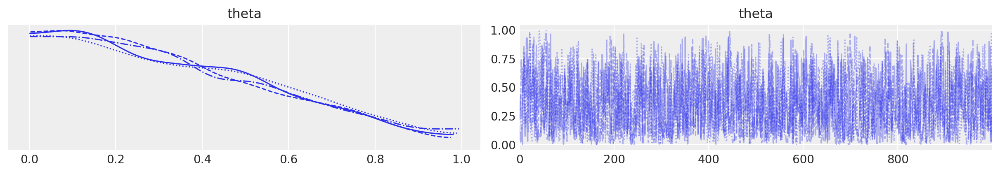

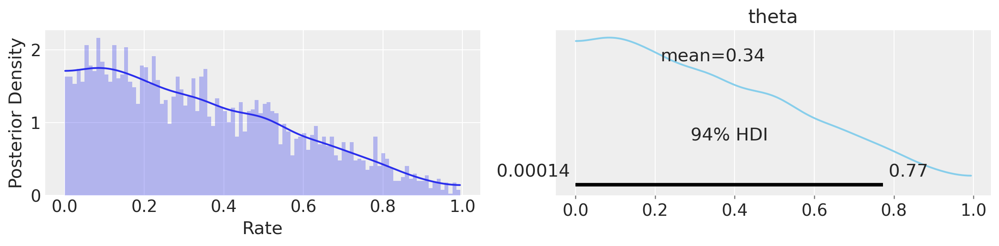

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
theta,0.345,0.238,0.0,0.773,0.006,0.004,1442.619,1777.338,1.001


In [79]:
k = np.array([0])
n = np.array([1])

with pm.Model() as model5:
    # prior
    theta = pm.Beta("theta", alpha=1, beta=1)
    # observed
    x = pm.Binomial("x", n=n, p=theta, observed=k)
    # inference
    trace5 = pm.sample()
    
az.plot_trace(trace5, var_names=["theta"]);

_, axes = plt.subplots(1, 2, figsize=(12, 3))

az.plot_kde(np.array(trace5.posterior["theta"]).flatten(), ax=axes[0])
axes[0].hist(np.array(trace5.posterior["theta"]).flatten(), bins=100, density=1, alpha=0.3)
axes[0].set_xlabel("Rate")
axes[0].set_ylabel("Posterior Density")

az.plot_posterior(trace5, var_names=["theta"], ax=axes[1], color="#87ceeb")

plt.tight_layout()
plt.show()

az.summary(
    trace5, var_names=["theta"], round_to=3
)

    From the above example, after observing one failure, the posterior distribution shifts significantly to the left (towards 0).

    What if we change the prior distribution to Beta(100, 100)? 

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [theta]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 27 seconds.
/var/folders/6y/fdf8wk_52jl4c5d2bnv27j240000gn/T/ipykernel_7711/321061091.py:23: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


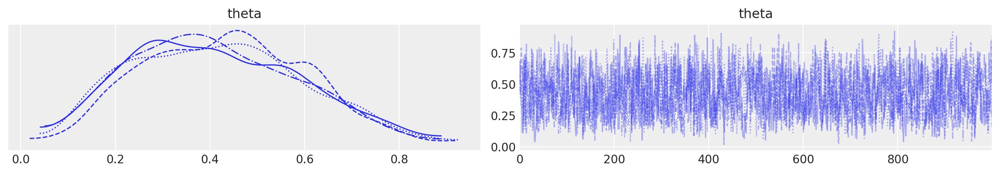

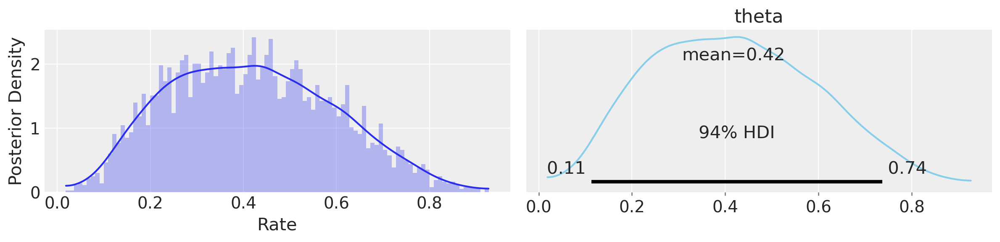

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
theta,0.418,0.176,0.113,0.737,0.004,0.003,1732.494,2742.138,1.001


In [83]:
k = np.array([0])
n = np.array([1])

with pm.Model() as model6:
    # prior
    theta = pm.Beta("theta", alpha=3, beta=3)
    # observed
    x = pm.Binomial("x", n=n, p=theta, observed=k)
    # inference
    trace6 = pm.sample()
    
az.plot_trace(trace6, var_names=["theta"]);

_, axes = plt.subplots(1, 2, figsize=(12, 3))

az.plot_kde(np.array(trace6.posterior["theta"]).flatten(), ax=axes[0])
axes[0].hist(np.array(trace6.posterior["theta"]).flatten(), bins=100, density=1, alpha=0.3)
axes[0].set_xlabel("Rate")
axes[0].set_ylabel("Posterior Density")

az.plot_posterior(trace6, var_names=["theta"], ax=axes[1], color="#87ceeb")

plt.tight_layout()
plt.show()

az.summary(
    trace6, var_names=["theta"], round_to=3
)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [theta]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 26 seconds.
/var/folders/6y/fdf8wk_52jl4c5d2bnv27j240000gn/T/ipykernel_7711/4155358794.py:23: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


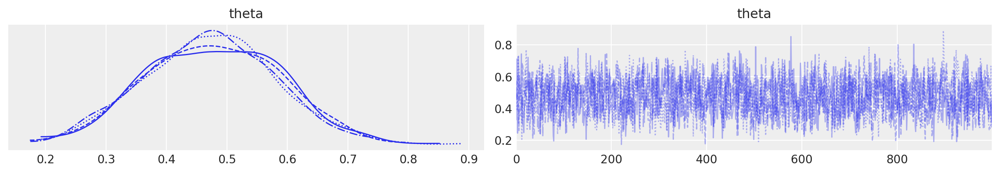

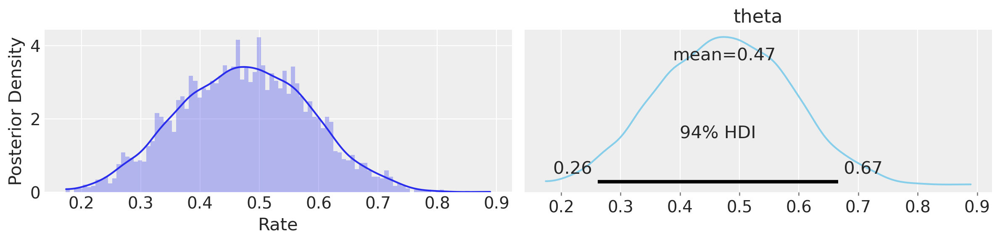

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
theta,0.475,0.109,0.262,0.666,0.003,0.002,1528.918,2583.913,1.002


In [84]:
k = np.array([0])
n = np.array([1])

with pm.Model() as model7:
    # prior
    theta = pm.Beta("theta", alpha=10, beta=10)
    # observed
    x = pm.Binomial("x", n=n, p=theta, observed=k)
    # inference
    trace7 = pm.sample()
    
az.plot_trace(trace7, var_names=["theta"]);

_, axes = plt.subplots(1, 2, figsize=(12, 3))

az.plot_kde(np.array(trace7.posterior["theta"]).flatten(), ax=axes[0])
axes[0].hist(np.array(trace7.posterior["theta"]).flatten(), bins=100, density=1, alpha=0.3)
axes[0].set_xlabel("Rate")
axes[0].set_ylabel("Posterior Density")

az.plot_posterior(trace7, var_names=["theta"], ax=axes[1], color="#87ceeb")

plt.tight_layout()
plt.show()

az.summary(
    trace7, var_names=["theta"], round_to=3
)

## 3.2 Difference between two rates

Inferring the rate $\theta$ of two binary process  
$$ \theta \sim \text{Beta}(1, 1)  $$
$$ k \sim \text{Binomial} ( \theta, n)  $$

In the example, we set k1 = 5, n1 = 10 and k2 = 7, n2 = 10 

The model involve a deterministic part in pymc.

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [theta1, theta2]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 29 seconds.


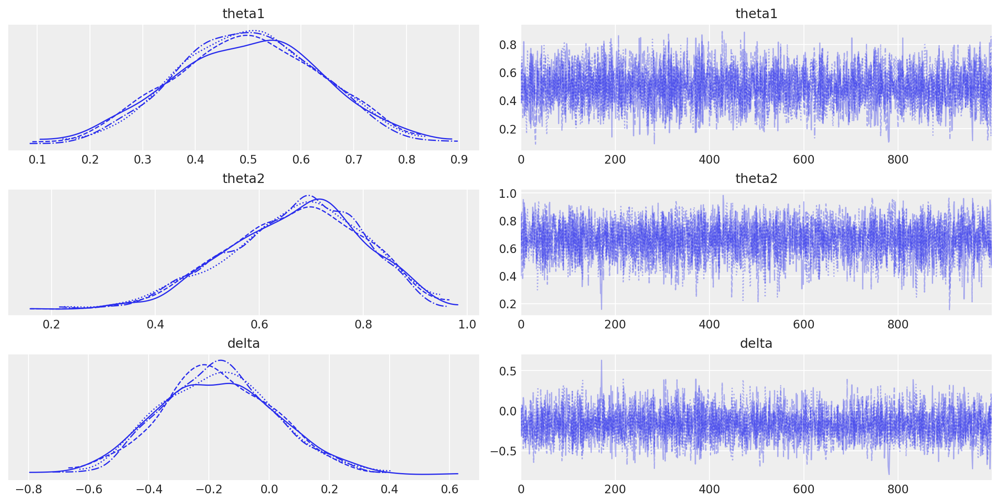

In [ ]:
# data
k1, k2 = 5, 7
n1 = n2 = 10 # Note that here we use integers instead of arrays 
# (Maybe because x1 and x2 are generated from different Binomial distributions)

with pm.Model() as model2:
    # prior
    theta1 = pm.Beta("theta1", alpha=1, beta=1)
    theta2 = pm.Beta("theta2", alpha=1, beta=1)
    # observed
    x1 = pm.Binomial("x1", n=n1, p=theta1, observed=k1) # This describes how each observed variable is derived (the "mechanism" of the model).
    x2 = pm.Binomial("x2", n=n2, p=theta2, observed=k2)
    # differences as deterministic
    delta = pm.Deterministic("delta", theta1 - theta2) # pm.Deterministic for deterministic variables
    # inference
    trace2 = pm.sample()

# idata2 = az.from_pymc3(trace2)
az.plot_trace(trace2);

In [87]:
# az.summary(idata2)
az.summary(trace2)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
theta1,0.500,0.136,0.243,0.748,0.002,0.002,3897.0,3052.0,1.0
theta2,0.668,0.130,0.425,0.891,0.002,0.001,4050.0,2833.0,1.0
delta,-0.169,0.190,-0.508,0.200,0.003,0.003,3960.0,3034.0,1.0


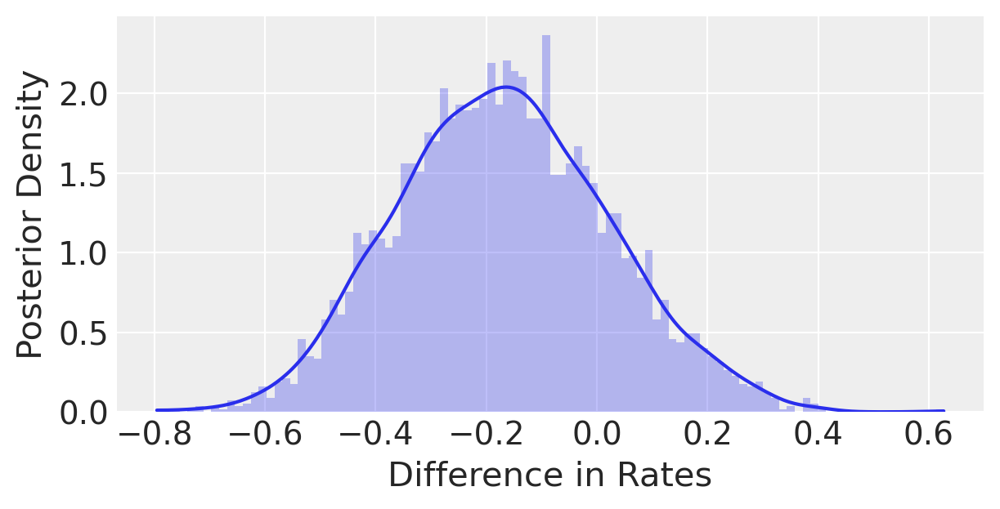

In [89]:
_, axes = plt.subplots(1, 1, figsize=(6, 3))

az.plot_kde(trace2.posterior["delta"].to_numpy().flatten(), ax=axes)
axes.hist(trace2.posterior["delta"].to_numpy().flatten(), bins=100, density=1, alpha=0.3)
axes.set_xlabel("Difference in Rates")
axes.set_ylabel("Posterior Density");

### Exercises

#### Exercise 3.2.1

Prediction: With more trials, the posterior distribution for $\delta$ will be thinner.

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [theta1, theta2]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 26 seconds.


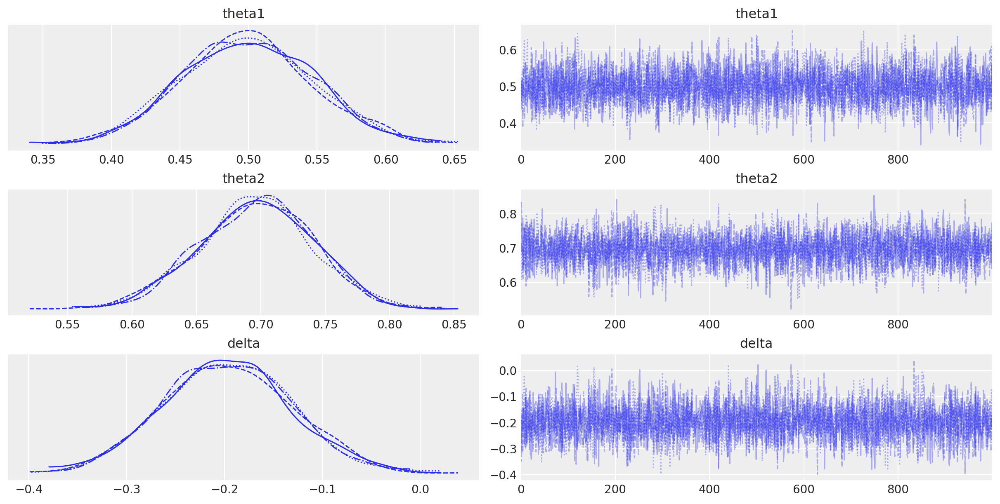

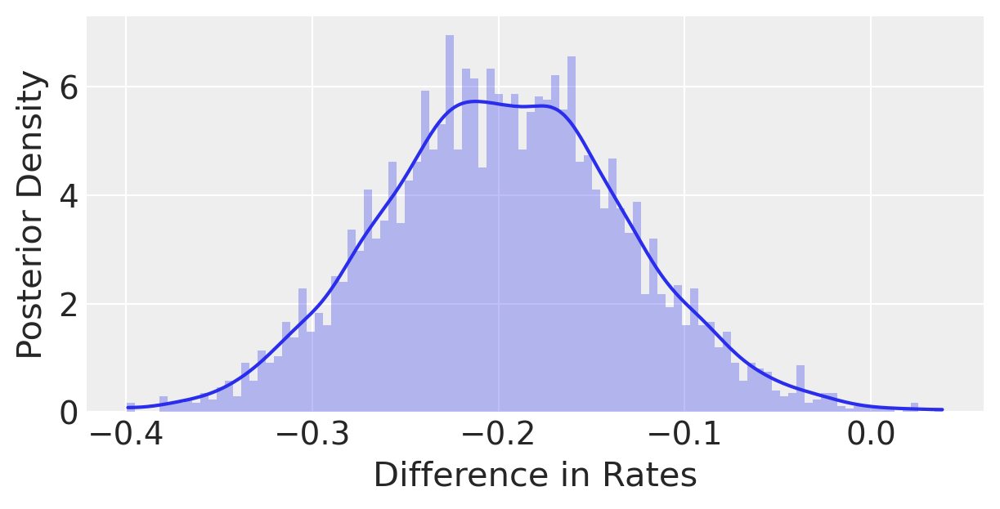

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
theta1,0.499,0.048,0.412,0.593,0.001,0.001,4240.0,2645.0,1.0
theta2,0.696,0.045,0.615,0.780,0.001,0.001,3644.0,3077.0,1.0
delta,-0.197,0.066,-0.320,-0.072,0.001,0.001,4280.0,2762.0,1.0


In [90]:
k1, k2 = 50, 70
n1 = n2 = 100

with pm.Model() as model2_1:
    # prior
    theta1 = pm.Beta("theta1", alpha=1, beta=1)
    theta2 = pm.Beta("theta2", alpha=1, beta=1)
    # observed
    x1 = pm.Binomial("x1", n=n1, p=theta1, observed=k1)
    x2 = pm.Binomial("x2", n=n2, p=theta2, observed=k2)
    # differences as deterministic
    delta = pm.Deterministic("delta", theta1 - theta2)
    # inference
    trace2_1 = pm.sample()
    
az.plot_trace(trace2_1);

_, axes = plt.subplots(1, 1, figsize=(6, 3))

az.plot_kde(trace2_1.posterior["delta"].to_numpy().flatten(), ax=axes)
axes.hist(trace2_1.posterior["delta"].to_numpy().flatten(), bins=100, density=1, alpha=0.3)
axes.set_xlabel("Difference in Rates")
axes.set_ylabel("Posterior Density");
plt.show()

az.summary(trace2_1)

#### Exercise 3.2.2

For k1/n1: $\theta_1$ shifts towards 0, mean 0.33; 

For k2/n2: $\theta_2$ shifts towards 0 (more severe), mean 1/7 = 0.14.

$\delta$: highly likely to be near 0; mean around 0.19.

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [theta1, theta2]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 24 seconds.


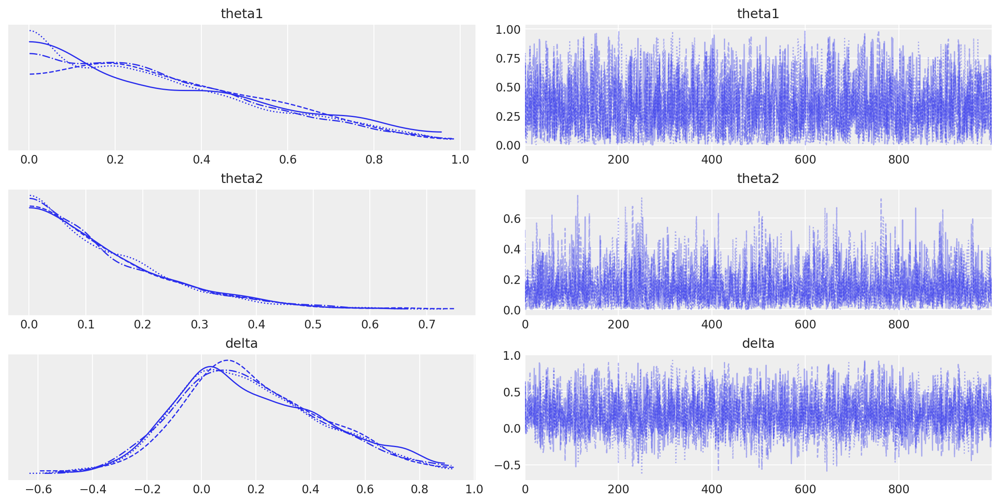

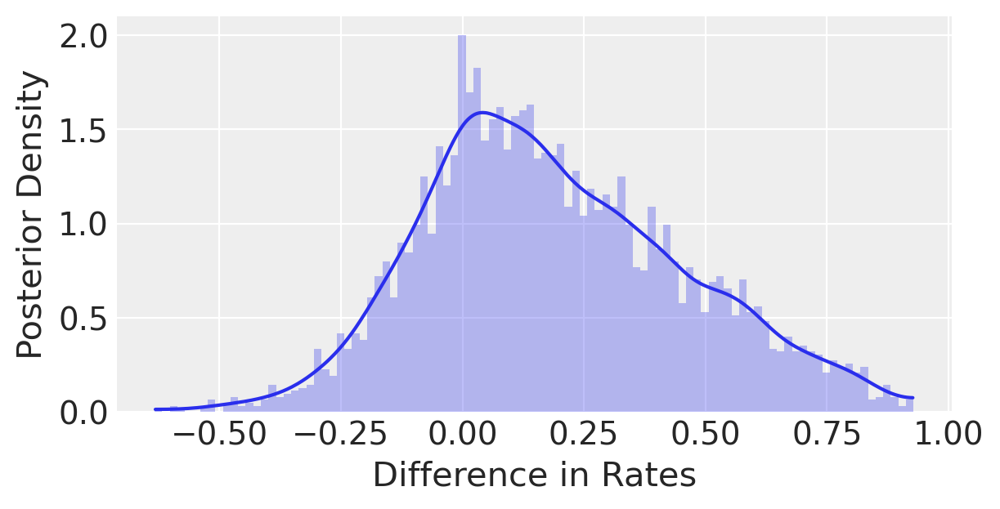

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
theta1,0.332,0.237,0.000,0.760,0.004,0.003,2699.0,1565.0,1.0
theta2,0.144,0.125,0.000,0.376,0.002,0.002,2802.0,2044.0,1.0
delta,0.188,0.269,-0.257,0.738,0.005,0.004,3062.0,2626.0,1.0


In [91]:
k1 = k2 = 0
n1, n2 = 1, 5

with pm.Model() as model2_2:
    # prior
    theta1 = pm.Beta("theta1", alpha=1, beta=1)
    theta2 = pm.Beta("theta2", alpha=1, beta=1)
    # observed
    x1 = pm.Binomial("x1", n=n1, p=theta1, observed=k1)
    x2 = pm.Binomial("x2", n=n2, p=theta2, observed=k2)
    # differences as deterministic
    delta = pm.Deterministic("delta", theta1 - theta2)
    # inference
    trace2_2 = pm.sample()
    
az.plot_trace(trace2_2);

_, axes = plt.subplots(1, 1, figsize=(6, 3))

az.plot_kde(trace2_2.posterior["delta"].to_numpy().flatten(), ax=axes)
axes.hist(trace2_2.posterior["delta"].to_numpy().flatten(), bins=100, density=1, alpha=0.3)
axes.set_xlabel("Difference in Rates")
axes.set_ylabel("Posterior Density");
plt.show()

az.summary(trace2_2)

#### Exercise 3.2.3

When different possible summaries of the posterior distribution of $\delta$ are reasonable: 

    - For hypothesis testing: see the HDI or CI of $\delta$.
    - For estimation: eg. when SD is small, the mean is informative.

When the full posterior distribution is needed: 

    - When the posterior distribution is not symmetric, the mean is not informative.
    - When the SD is large

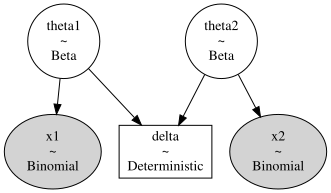

In [94]:
# show model2_2 in graphical form
pm.model_to_graphviz(model2_2)

## 3.3 Inferring a common rate

In [96]:
# Multiple trials
k = np.array([5, 7])
n = np.array([10, 10])

with pm.Model() as model3:
    # prior
    theta = pm.Beta("theta", alpha=1, beta=1)
    # observed
    x = pm.Binomial("x", n=n, p=theta, observed=k)
    # inference
    trace3 = pm.sample()

# idata3 = az.from_pymc3(trace3)
az.summary(trace3)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [theta]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 29 seconds.


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
theta,0.59,0.102,0.401,0.778,0.002,0.002,1731.0,2813.0,1.0


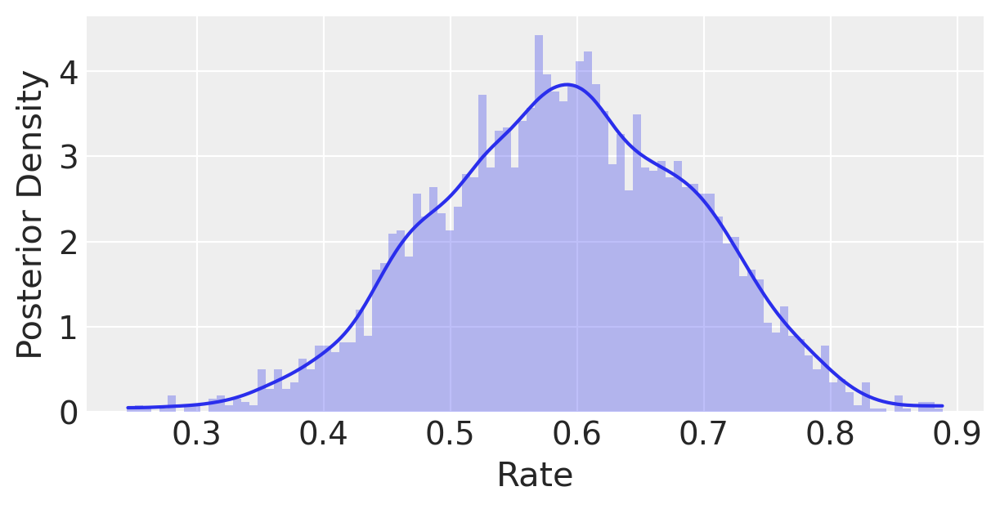

In [97]:
_, axes = plt.subplots(1, 1, figsize=(6, 3))

az.plot_kde(trace3.posterior["theta"].to_numpy().flatten(), ax=axes)
axes.hist(trace3.posterior["theta"].to_numpy().flatten(), bins=100, density=1, alpha=0.3)

axes.set_xlabel("Rate")
axes.set_ylabel("Posterior Density");

### Exercises

#### Exercise 3.3.1

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [theta]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 26 seconds.


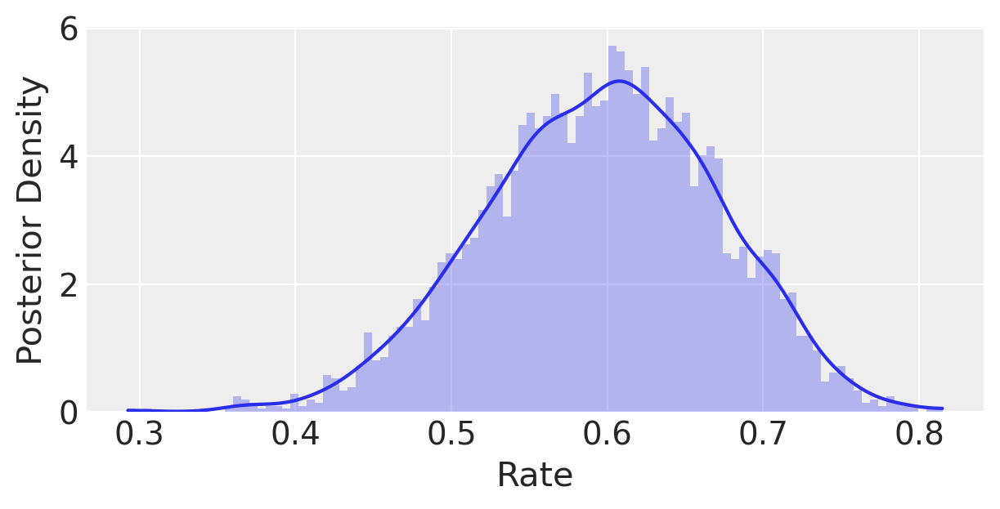

In [98]:
k = np.array([10, 14])
n = np.array([20, 20])

with pm.Model() as model3_1:
    # prior
    theta = pm.Beta("theta", alpha=1, beta=1)
    # observed
    x = pm.Binomial("x", n=n, p=theta, observed=k)
    # inference
    trace3_1 = pm.sample()
    
az.summary(trace3_1)

_, axes = plt.subplots(1, 1, figsize=(6, 3))

az.plot_kde(trace3_1.posterior["theta"].to_numpy().flatten(), ax=axes)
axes.hist(trace3_1.posterior["theta"].to_numpy().flatten(), bins=100, density=1, alpha=0.3)

axes.set_xlabel("Rate")
axes.set_ylabel("Posterior Density");
plt.show()

In [99]:
az.summary(trace3_1)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
theta,0.595,0.075,0.458,0.732,0.002,0.001,1777.0,2738.0,1.0


#### Exercise 3.3.2

In [100]:
k = np.array([0, 10])
n = np.array([10, 10])

with pm.Model() as model3_2:
    # prior
    theta = pm.Beta("theta", alpha=1, beta=1)
    # observed
    x = pm.Binomial("x", n=n, p=theta, observed=k)
    # inference
    trace3_2 = pm.sample()
    
az.summary(trace3_2)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [theta]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 30 seconds.


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
theta,0.495,0.104,0.306,0.692,0.003,0.002,1693.0,2457.0,1.0


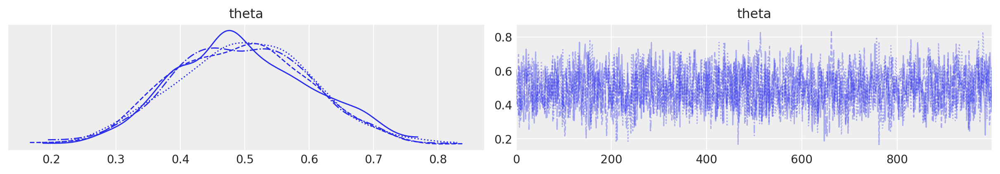

In [102]:
az.plot_trace(trace3_2);

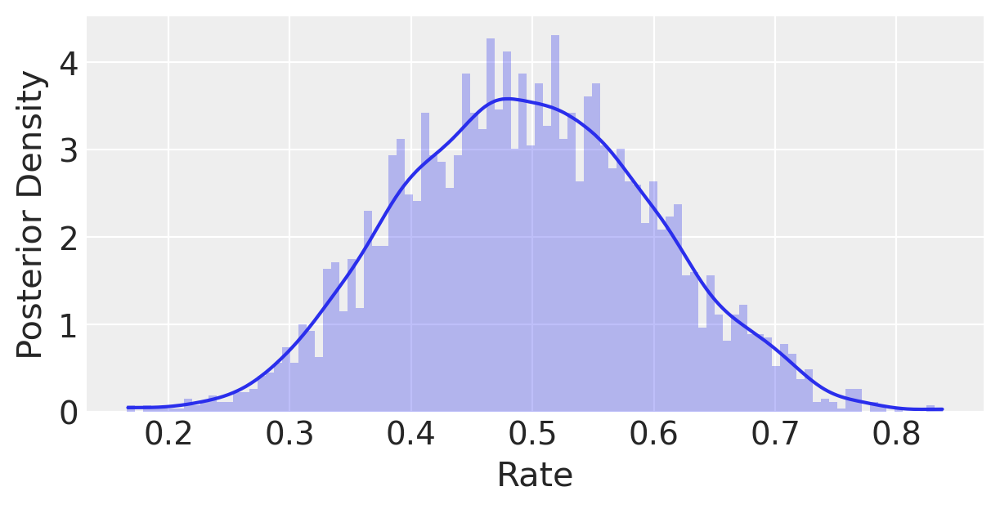

In [108]:
_, axes = plt.subplots(1, 1, figsize=(6, 3))

az.plot_kde(trace3_2.posterior["theta"].to_numpy().flatten(), ax=axes)
axes.hist(trace3_2.posterior["theta"].to_numpy().flatten(), bins=100, density=1, alpha=0.3)
axes.set_xlabel("Rate")
axes.set_ylabel("Posterior Density");
plt.show()

In [109]:
az.summary(trace3_2)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
theta,0.495,0.104,0.306,0.692,0.003,0.002,1693.0,2457.0,1.0


It infers the common rate to be 0.5. But intuitively the two data should be generated by different $\theta$s. 
    
> GPT: This is because the data are generated from different Binomial distributions. The model assumes that the data are generated from the same distribution. This is a limitation of the model. The model is not flexible enough to capture the difference in the data.

#### Exercise 3.3.3

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [theta]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 26 seconds.


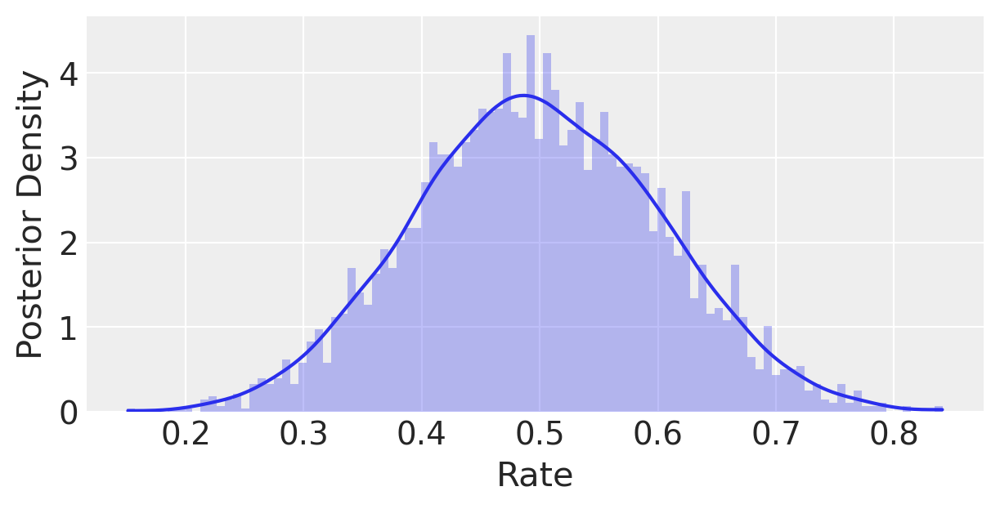

In [111]:
# group 1: 7/10, 3/10
k = np.array([7, 3])
n = np.array([10, 10])

with pm.Model() as model3_3_1:
    # prior
    theta = pm.Beta("theta", alpha=1, beta=1) # 之前copilot在这里自作主张加了一个shape=2, 这样好像就变成two independent rates了
    # observed
    x = pm.Binomial("x", n=n, p=theta, observed=k)
    # inference
    trace3_3_1 = pm.sample()
    
az.summary(trace3_3_1)
pass

_, axes = plt.subplots(1, 1, figsize=(6, 3))

az.plot_kde(trace3_3_1.posterior["theta"].to_numpy().flatten(), ax=axes)
axes.hist(trace3_3_1.posterior["theta"].to_numpy().flatten(), bins=100, density=1, alpha=0.3)
axes.set_xlabel("Rate")
axes.set_ylabel("Posterior Density");
plt.show()

In [112]:
az.summary(trace3_3_1)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
theta,0.498,0.104,0.309,0.696,0.002,0.002,1749.0,2944.0,1.0


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [theta]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 25 seconds.


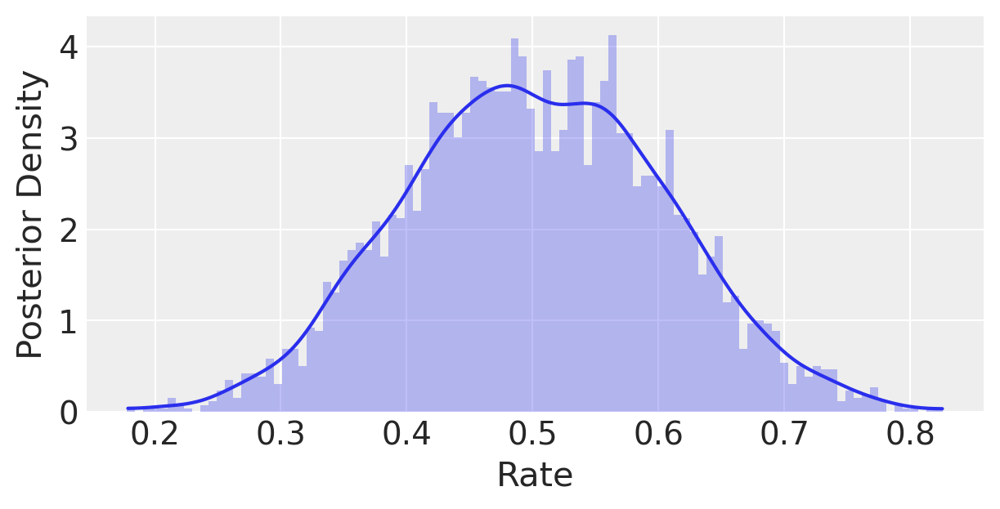

In [113]:
# group 2: 5/10, 5/10
k = np.array([5, 5])
n = np.array([10, 10])

with pm.Model() as model3_3_2:
    # prior
    theta = pm.Beta("theta", alpha=1, beta=1)
    # observed
    x = pm.Binomial("x", n=n, p=theta, observed=k)
    # inference
    trace3_3_2 = pm.sample()
    
az.summary(trace3_3_2)
pass

_, axes = plt.subplots(1, 1, figsize=(6, 3))

az.plot_kde(trace3_3_2.posterior["theta"].to_numpy().flatten(), ax=axes)
axes.hist(trace3_3_2.posterior["theta"].to_numpy().flatten(), bins=100, density=1, alpha=0.3)
axes.set_xlabel("Rate")
axes.set_ylabel("Posterior Density");
plt.show()

In [115]:
az.summary(trace3_3_2)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
theta,0.502,0.104,0.32,0.701,0.003,0.002,1686.0,2777.0,1.0


So if we assume there is a common parameter $\theta$, then whatever the data is, they seem to be considered "jointly" as evidence for the common parameter. 

In this example, [7, 3] and [5, 5] yield almost same posterior distribution for $\theta$. That is, the model cannot distinguish between the two data sets.

## 3.4 Prior and posterior prediction

In [116]:
k = 1
n = 15
# Uncomment for Trompetter Data
# k = 24
# n = 121

with pm.Model() as model_obs:
    theta = pm.Beta("theta", alpha=1, beta=1)
    x = pm.Binomial("x", n=n, p=theta, observed=k)

    priors = pm.sample_prior_predictive()
    trace_obs = pm.sample()
    ppc = pm.sample_posterior_predictive(trace_obs)

Sampling: [theta, x]


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [theta]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 26 seconds.
Sampling: [x]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/var/folders/6y/fdf8wk_52jl4c5d2bnv27j240000gn/T/ipykernel_7711/1359451000.py:27: UserWarning: The figure layout has changed to tight
  plt.tight_layout();


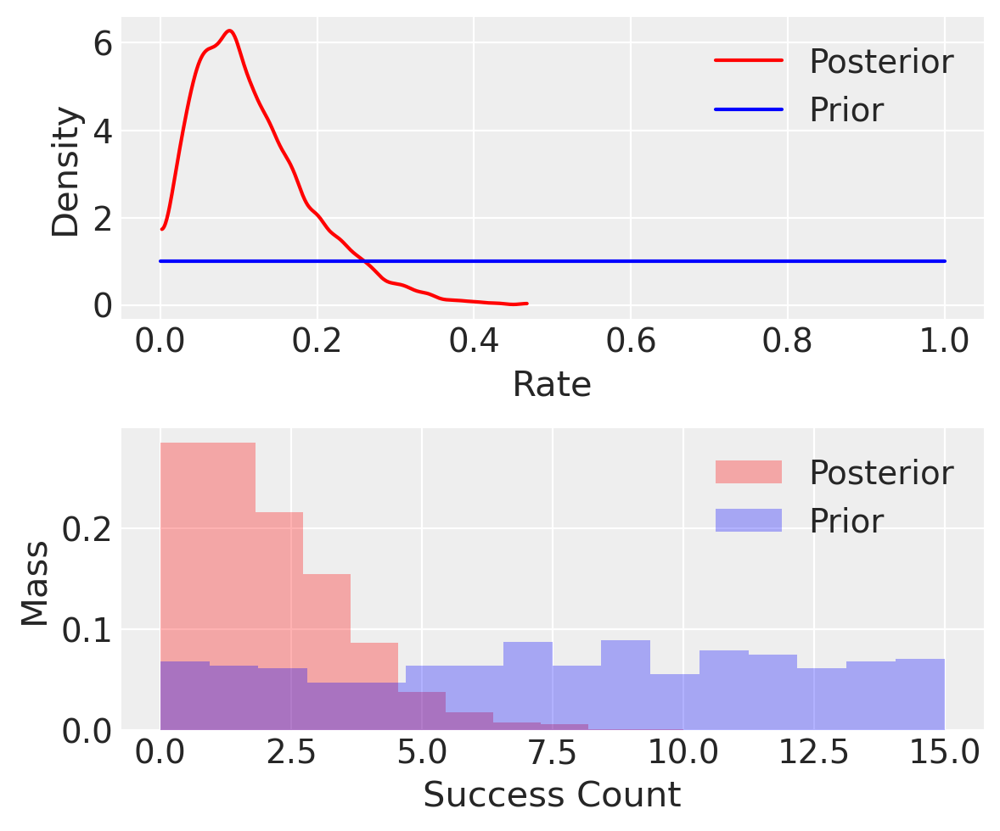

In [130]:
prior_x = priors.prior_predictive["x"].to_numpy().flatten()
pred_theta = trace_obs.posterior["theta"].to_numpy().flatten()

_, axes = plt.subplots(2, 1, figsize=(6, 5))

az.plot_kde(pred_theta, ax=axes[0], plot_kwargs={"color": "r"}, label="Posterior")
x = np.linspace(0, 1, 100)
axes[0].plot(x, stats.beta.pdf(x, 1, 1), color="b", label="Prior")
axes[0].set_xlabel("Rate")
axes[0].set_ylabel("Density")
axes[0].legend()

predictx = ppc.posterior_predictive['x'].to_numpy().flatten()
axes[1].hist(
    predictx,
    density=1,
    bins=len(np.unique(predictx)),
    alpha=0.3,
    color="r",
    label="Posterior",
)
axes[1].hist(prior_x, density=1, bins=n + 1, alpha=0.3, color="b", label="Prior")
axes[1].set_xlabel("Success Count")
axes[1].set_ylabel("Mass")
axes[1].legend()

plt.tight_layout();

### Exercises

#### Exercise 3.4.1

The top panel of the figure is the prior and posterior distribution of $\theta$. $\theta$ is continuous, so it is a line plot.

The bottom panel is the prior and posterior predictive distribution of k. k is discrete, so it is a bar plot.

#### Exercise 3.4.2

Sampling: [theta, x]


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [theta]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 23 seconds.
Sampling: [x]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/var/folders/6y/fdf8wk_52jl4c5d2bnv27j240000gn/T/ipykernel_7711/780113899.py:41: UserWarning: The figure layout has changed to tight
  plt.tight_layout();


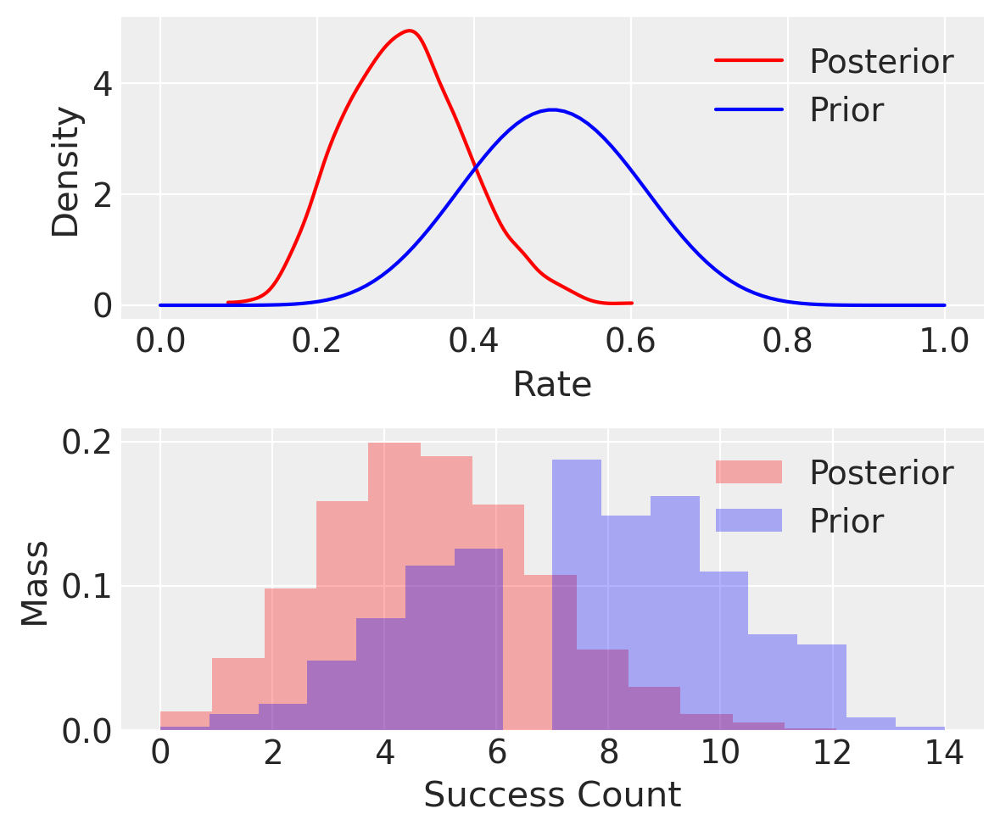

In [139]:
k = 1
n = 15

with pm.Model() as model_obs:
    theta = pm.Beta("theta", alpha=10, beta=10)
    x = pm.Binomial("x", n=n, p=theta, observed=k)

    priors = pm.sample_prior_predictive()
    trace_obs = pm.sample()
    ppc = pm.sample_posterior_predictive(trace_obs)
    
prior_x = priors.prior_predictive["x"].to_numpy().flatten()
pred_theta = trace_obs.posterior["theta"].to_numpy().flatten()

_, axes = plt.subplots(2, 1, figsize=(6, 5))

az.plot_kde(pred_theta, ax=axes[0], plot_kwargs={"color": "r"}, label="Posterior")
x = np.linspace(0, 1, 100)
axes[0].plot(x, stats.beta.pdf(x, 10, 10), color="b", label="Prior")
axes[0].set_xlabel("Rate")
axes[0].set_ylabel("Density")
axes[0].legend()

predictx = ppc.posterior_predictive['x'].to_numpy().flatten()
axes[1].hist(
    predictx,
    density=1,
    bins=len(np.unique(predictx)),
    alpha=0.3,
    color="r",
    label="Posterior",
)
axes[1].hist(prior_x, density=1, bins=n + 1, alpha=0.3, color="b", label="Prior")
axes[1].set_xlabel("Success Count")
axes[1].set_ylabel("Mass")
axes[1].legend()

plt.tight_layout();

Sampling: [theta, x]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [theta]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 28 seconds.
Sampling: [x]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/var/folders/6y/fdf8wk_52jl4c5d2bnv27j240000gn/T/ipykernel_7711/4247650301.py:40: UserWarning: The figure layout has changed to tight
  plt.tight_layout();


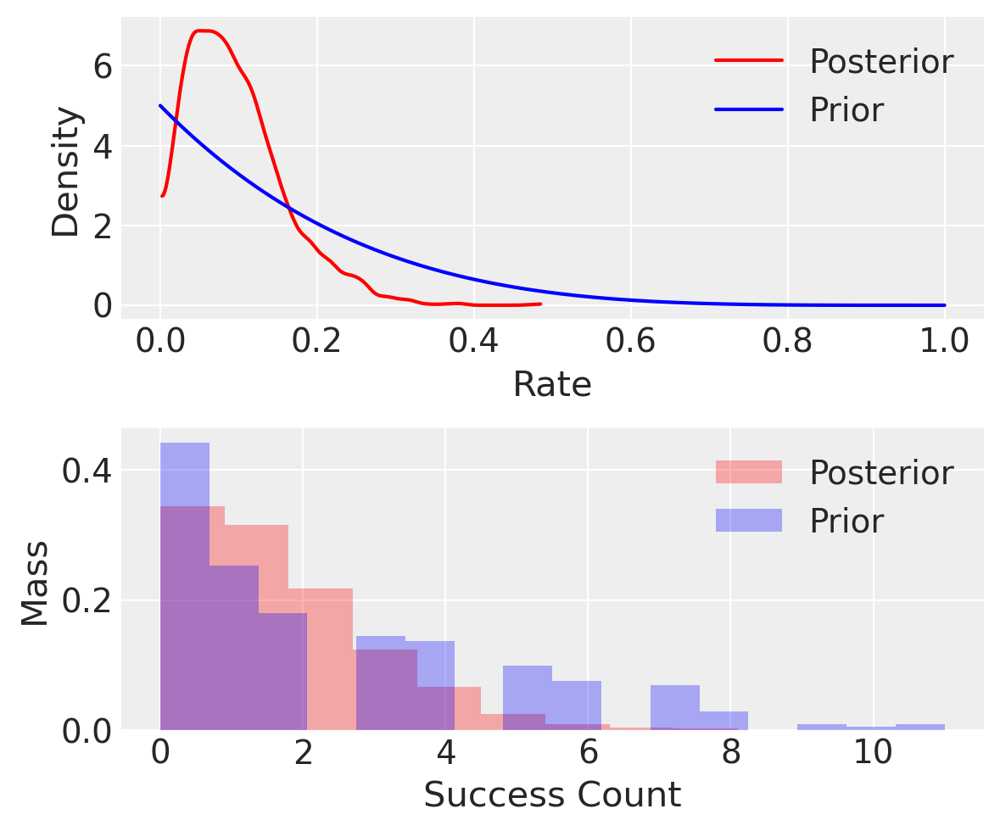

In [140]:
k = 1
n = 15

alpha, beta = 1, 5

with pm.Model() as model_obs:
    theta = pm.Beta("theta", alpha=alpha, beta=beta)
    x = pm.Binomial("x", n=n, p=theta, observed=k)

    priors = pm.sample_prior_predictive()
    trace_obs = pm.sample()
    ppc = pm.sample_posterior_predictive(trace_obs)
    
prior_x = priors.prior_predictive["x"].to_numpy().flatten()
pred_theta = trace_obs.posterior["theta"].to_numpy().flatten()

_, axes = plt.subplots(2, 1, figsize=(6, 5))

az.plot_kde(pred_theta, ax=axes[0], plot_kwargs={"color": "r"}, label="Posterior")
x = np.linspace(0, 1, 100)
axes[0].plot(x, stats.beta.pdf(x, alpha, beta), color="b", label="Prior")
axes[0].set_xlabel("Rate")
axes[0].set_ylabel("Density")
axes[0].legend()

predictx = ppc.posterior_predictive['x'].to_numpy().flatten()
axes[1].hist(
    predictx,
    density=1,
    bins=len(np.unique(predictx)),
    alpha=0.3,
    color="r",
    label="Posterior",
)
axes[1].hist(prior_x, density=1, bins=n + 1, alpha=0.3, color="b", label="Prior")
axes[1].set_xlabel("Success Count")
axes[1].set_ylabel("Mass")
axes[1].legend()

plt.tight_layout();

##### Beta(0.1, 0.1)

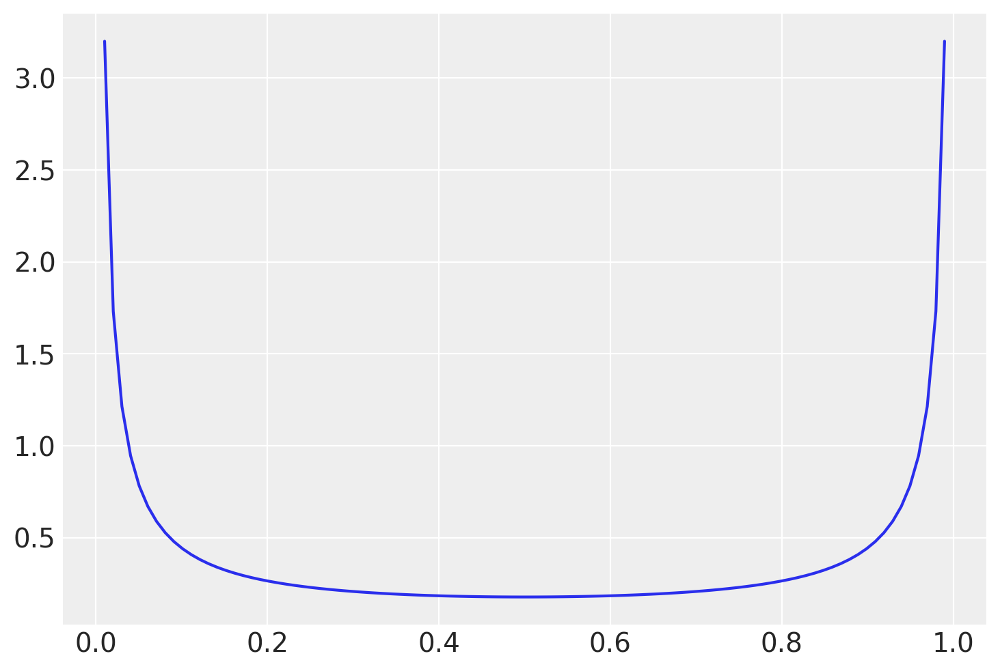

In [142]:
plt.plot(x, stats.beta.pdf(x, 0.1, 0.1), label="alpha=0.1, beta=0.1")

Sampling: [theta, x]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [theta]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 24 seconds.
Sampling: [x]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/var/folders/6y/fdf8wk_52jl4c5d2bnv27j240000gn/T/ipykernel_7711/1901105395.py:40: UserWarning: The figure layout has changed to tight
  plt.tight_layout();


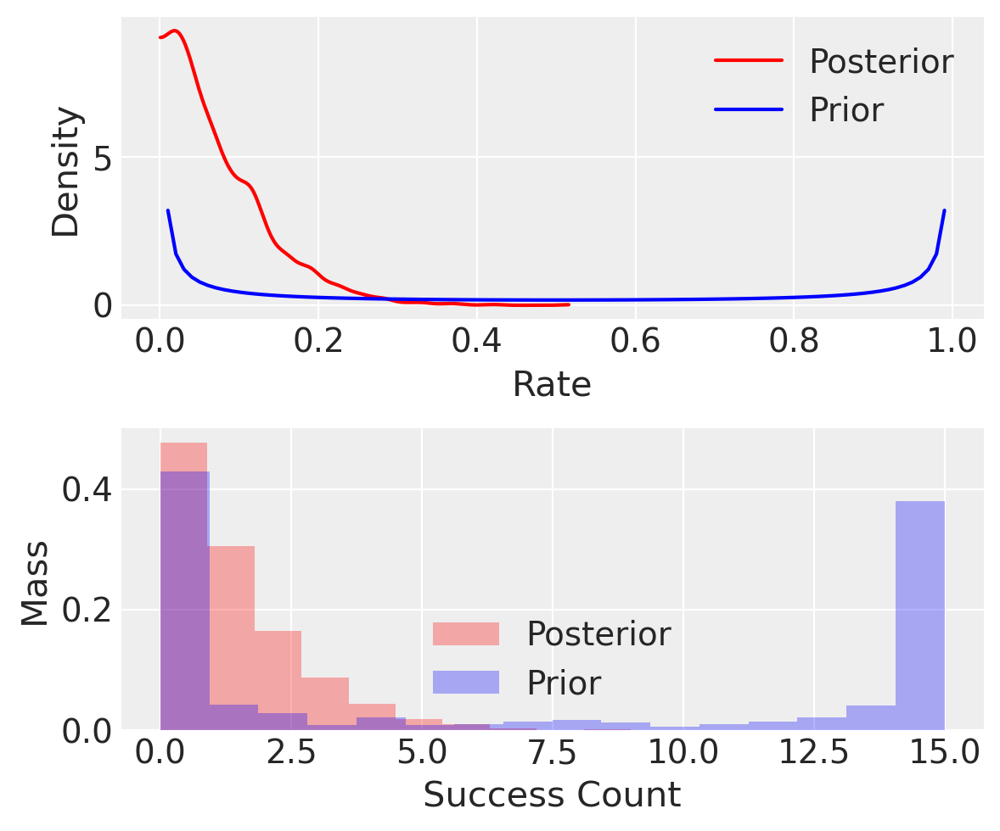

In [143]:
k = 1
n = 15

alpha, beta = 0.1, 0.1

with pm.Model() as model_obs:
    theta = pm.Beta("theta", alpha=alpha, beta=beta)
    x = pm.Binomial("x", n=n, p=theta, observed=k)

    priors = pm.sample_prior_predictive()
    trace_obs = pm.sample()
    ppc = pm.sample_posterior_predictive(trace_obs)
    
prior_x = priors.prior_predictive["x"].to_numpy().flatten()
pred_theta = trace_obs.posterior["theta"].to_numpy().flatten()

_, axes = plt.subplots(2, 1, figsize=(6, 5))

az.plot_kde(pred_theta, ax=axes[0], plot_kwargs={"color": "r"}, label="Posterior")
x = np.linspace(0, 1, 100)
axes[0].plot(x, stats.beta.pdf(x, alpha, beta), color="b", label="Prior")
axes[0].set_xlabel("Rate")
axes[0].set_ylabel("Density")
axes[0].legend()

predictx = ppc.posterior_predictive['x'].to_numpy().flatten()
axes[1].hist(
    predictx,
    density=1,
    bins=len(np.unique(predictx)),
    alpha=0.3,
    color="r",
    label="Posterior",
)
axes[1].hist(prior_x, density=1, bins=n + 1, alpha=0.3, color="b", label="Prior")
axes[1].set_xlabel("Success Count")
axes[1].set_ylabel("Mass")
axes[1].legend()

plt.tight_layout();

#### Exercise 3.4.3

An example of how to generate data from a model (given all parameters' distributions)

Sampling: [theta, x]


(array([0.0021, 0.0147, 0.0168, 0.0126, 0.0252, 0.021 , 0.0441, 0.0378,
        0.0336, 0.042 , 0.0483, 0.0609, 0.0672, 0.0777, 0.0756, 0.0672,
        0.0672, 0.1029, 0.0861, 0.0777, 0.0693]),
 array([ 0.        ,  0.95238095,  1.9047619 ,  2.85714286,  3.80952381,
         4.76190476,  5.71428571,  6.66666667,  7.61904762,  8.57142857,
         9.52380952, 10.47619048, 11.42857143, 12.38095238, 13.33333333,
        14.28571429, 15.23809524, 16.19047619, 17.14285714, 18.0952381 ,
        19.04761905, 20.        ]),
 <BarContainer object of 21 artists>)

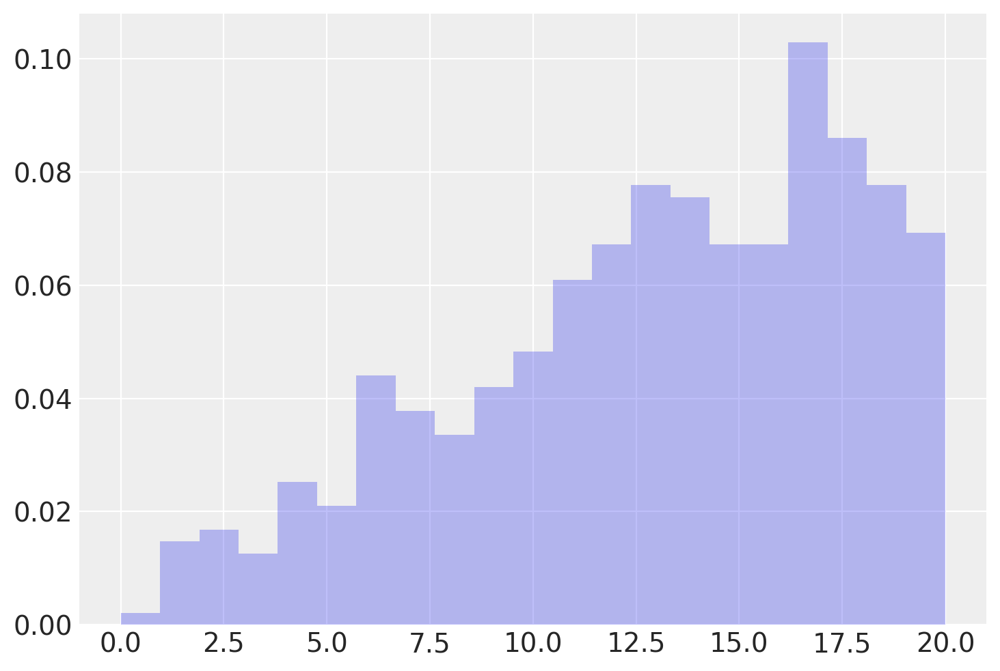

In [160]:
n_prime = 20 # originally it was 15

with pm.Model() as model4_3:
    theta = pm.Beta("theta", alpha=2, beta=1)
    x = pm.Binomial("x", n=n_prime, p=theta, observed=k) # here the argument "observed" seems not influencing the prior predictive sampling

    priors = pm.sample_prior_predictive()
    # trace_obs = pm.sample()
    # ppc = pm.sample_posterior_predictive(trace_obs)
    
plt.hist(priors.prior_predictive["x"].to_numpy().flatten(), bins=n_prime+1, density=1, alpha=0.3)
# plt.hist(ppc.posterior_predictive["x"].to_numpy().flatten(), bins=n_prime+1, density=1, alpha=0.3)

#### Exercise 3.4.4

Sampling: [theta, x]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [theta]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 29 seconds.
Sampling: [x]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

array([[<Axes: title={'center': 'theta'}>,
        <Axes: title={'center': 'theta'}>]], dtype=object)

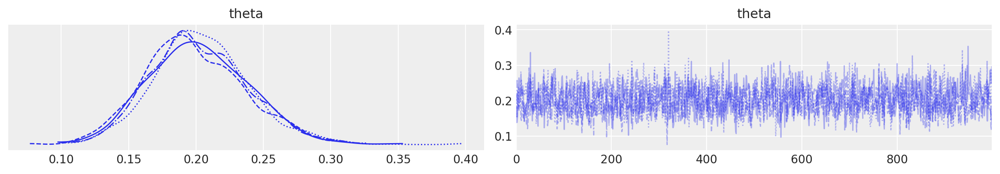

In [161]:
k = 24
n = 121

with pm.Model() as model3_4_4:
    # prior
    theta = pm.Beta("theta", alpha=1, beta=1)
    # observed
    x = pm.Binomial("x", n=n, p=theta, observed=k)
    
    prior_pred = pm.sample_prior_predictive()
    trace_obs = pm.sample()
    posterior_pred = pm.sample_posterior_predictive(trace_obs)
    
az.plot_trace(trace_obs)

/var/folders/6y/fdf8wk_52jl4c5d2bnv27j240000gn/T/ipykernel_7711/912129191.py:27: UserWarning: The figure layout has changed to tight
  plt.tight_layout();


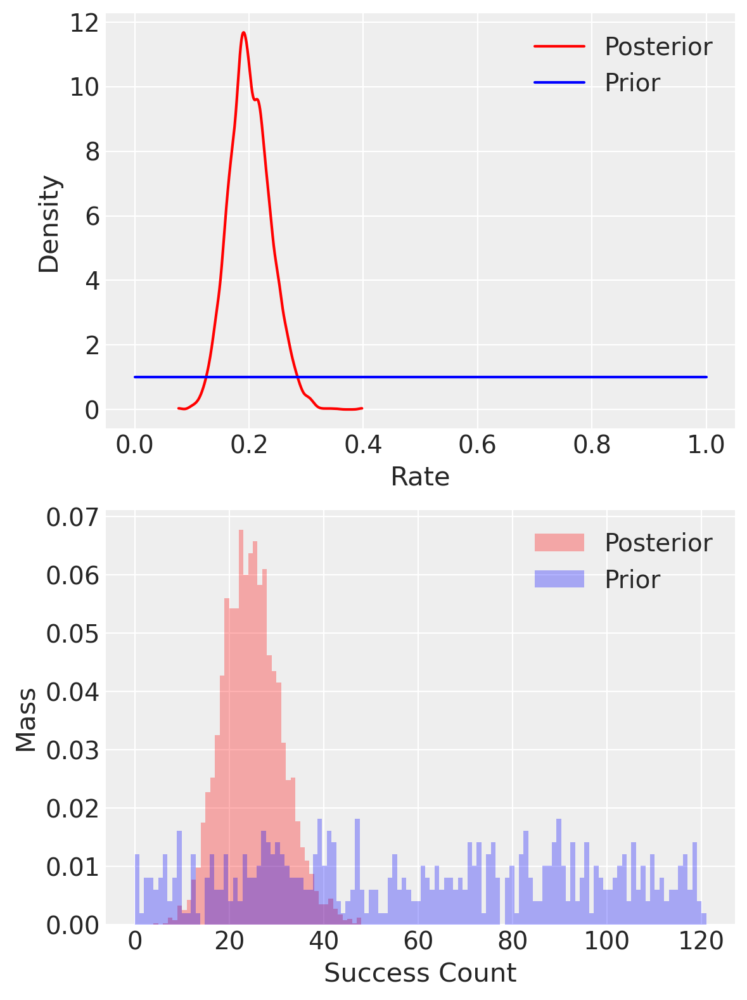

In [164]:
prior_x = prior_pred.prior_predictive["x"].to_numpy().flatten()
posterior_x = posterior_pred.posterior_predictive["x"].to_numpy().flatten()
posterior_theta = trace_obs.posterior["theta"].to_numpy().flatten()

_, axes = plt.subplots(2, 1, figsize=(6, 8))

az.plot_kde(posterior_theta, ax=axes[0], plot_kwargs={"color": "r"}, label="Posterior")
x = np.linspace(0, 1, 100)
axes[0].plot(x, stats.beta.pdf(x, 1, 1), color="b", label="Prior")
axes[0].set_xlabel("Rate")
axes[0].set_ylabel("Density")
axes[0].legend()

axes[1].hist(
    posterior_x,
    density=1,
    bins=len(np.unique(posterior_x)),
    alpha=0.3,
    color="r",
    label="Posterior",
)
axes[1].hist(prior_x, density=1, bins=n + 1, alpha=0.3, color="b", label="Prior")
axes[1].set_xlabel("Success Count")
axes[1].set_ylabel("Mass")
axes[1].legend()

plt.tight_layout();

In [168]:
# find the 95% credible interval of posterior_x
np.percentile(posterior_x, [2.5, 97.5]) / n * 100

array([10.74380165, 30.59917355])

In [165]:
az.summary(trace_obs)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
theta,0.202,0.036,0.135,0.27,0.001,0.001,1698.0,2941.0,1.0


10% to 30% is a range of around 20%, much bigger than Trompetter had expected. So her conclusion is wrong. 

    Note that here if we just look at the posterior distribution of $\theta$ (sd=0.036), we will draw a wrong conclusion that it will not change too much. Because, if so, we just analyze the variability of the posterior distribution of latent variable $\theta$. But Trompetter's original statement is about the percentage of the [number of people having experienced bully].

## 3.5 Posterior Predictive

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [theta]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 1 seconds.


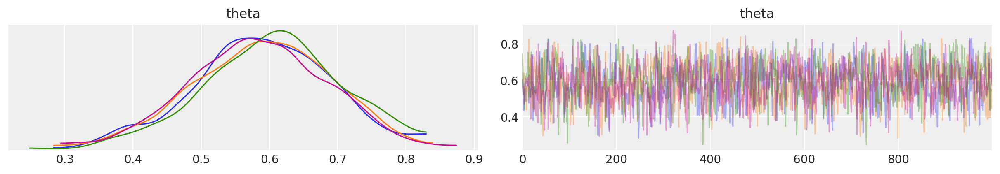

In [13]:
# Inferring a Common Rate, With Posterior Predictive
k1 = 2
n1 = 13
k2 = 10
n2 = 10

with pm.Model() as model5:
    # prior
    theta = pm.Beta("theta", alpha=1, beta=1)
    # observed
    x1 = pm.Binomial("x1", n=n2, p=theta, observed=k1)
    x2 = pm.Binomial("x2", n=n2, p=theta, observed=k2)
    # inference
    trace5 = pm.sample()
    # prediction (sample from trace)
    ppc5 = pm.sample_posterior_predictive(trace5)

idata5 = az.from_pymc3(trace5)
az.plot_trace(idata5, var_names=["theta"]);

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


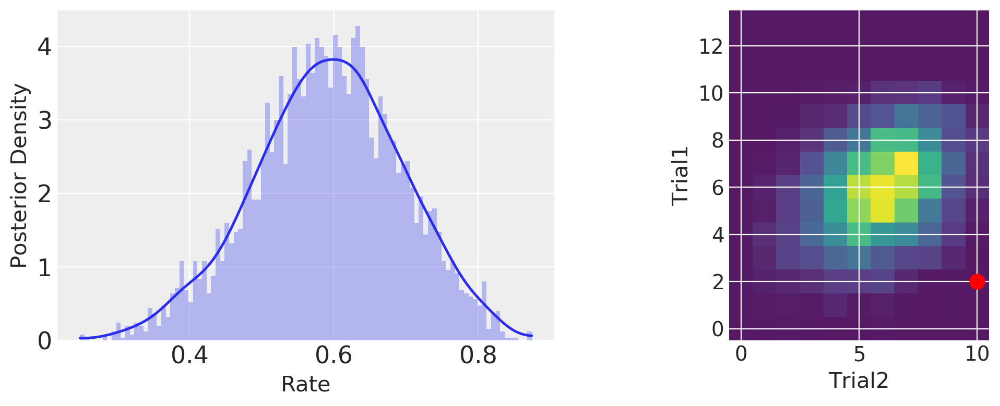

In [14]:
fig = plt.figure(figsize=(12, 4))
gs = gridspec.GridSpec(1, 2, width_ratios=[2, 3])
ax0 = plt.subplot(gs[0])

az.plot_kde(trace5["theta"], ax=ax0)
ax0.hist(trace5["theta"], bins=100, density=1, alpha=0.3)
ax0.set_xlabel("Rate")
ax0.set_ylabel("Posterior Density")

ax1 = plt.subplot(gs[1])
predx1 = ppc5["x1"]
predx2 = ppc5["x2"]

A = sparse.csc_matrix(
    (np.ones(len(predx1)), (predx1, predx2)), shape=(n1 + 1, n2 + 1)
).todense()
ax1.imshow(A, alpha=0.9, origin="lower", cmap="viridis")
ax1.scatter(k2, k1, s=100, c=[1, 0, 0])
ax1.set_xlabel("Trial2")
ax1.set_ylabel("Trial1")

plt.tight_layout();

## 3.6 Joint distributions

Multiprocess sampling (4 chains in 4 jobs)
CompoundStep
>NUTS: [theta]
>Metropolis: [TotalN]


Sampling 4 chains for 2_000 tune and 10_000 draw iterations (8_000 + 40_000 draws total) took 8 seconds.
The acceptance probability does not match the target. It is 0.902441611369047, but should be close to 0.8. Try to increase the number of tuning steps.
The acceptance probability does not match the target. It is 0.630426559705178, but should be close to 0.8. Try to increase the number of tuning steps.
The rhat statistic is larger than 1.05 for some parameters. This indicates slight problems during sampling.
The estimated number of effective samples is smaller than 200 for some parameters.


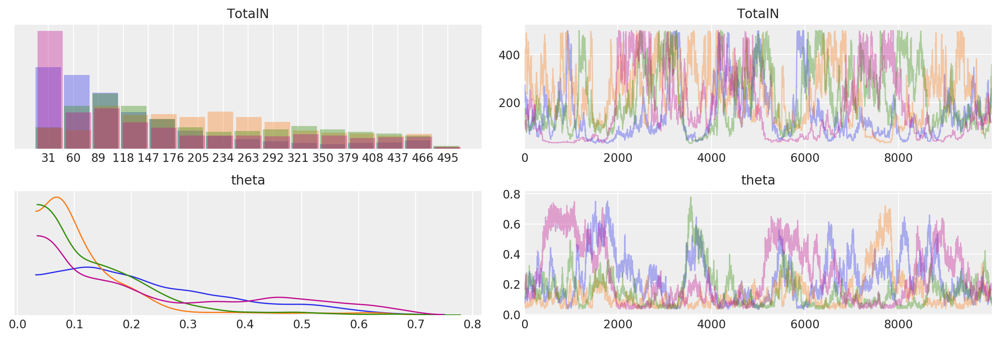

In [15]:
# the Survey example in the book
k = np.array([16, 18, 22, 25, 27])
nmax = 500
m = len(k)

with pm.Model() as model6:
    # prior
    theta = pm.Beta("theta", alpha=1, beta=1)
    TotalN = pm.DiscreteUniform("TotalN", lower=1, upper=nmax)
    # observed
    x = pm.Binomial("x", n=TotalN, p=theta, observed=k)
    # inference
    trace6 = pm.sample(10_000, tune=2000)

idata6 = az.from_pymc3(trace6)
az.plot_trace(idata6);

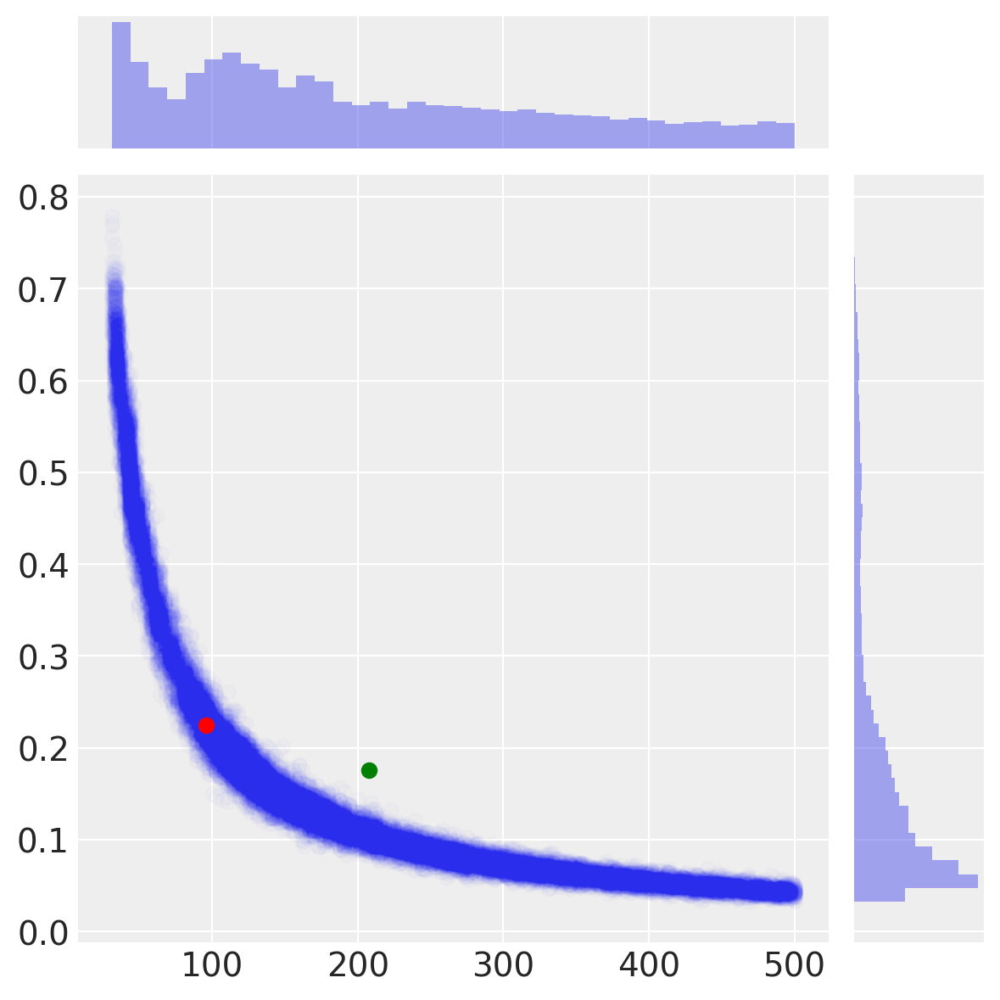

In [16]:
burnin = 9000
thetapost = trace6["theta"][burnin:]
npost = trace6["TotalN"][burnin:]

g = sns.jointplot(npost, thetapost, kind="scatter", stat_func=None, alpha=0.01)

cc = -float("Inf")
ind = 0

for i in range(0, len(npost)):
    logL = 0
    for j in k:
        logL = (
            logL
            + special.gammaln(npost[i] + 1)
            - special.gammaln(j + 1)
            - special.gammaln(npost[i] - j + 1)
        )
        logL = (
            logL + j * np.log(thetapost[i]) + (npost[i] - j) * np.log(1 - thetapost[i])
        )

    if logL > cc:
        ind = i
        cc = logL

g.ax_joint.plot(np.mean(npost), np.mean(thetapost), "o", color="g")
g.ax_joint.plot(npost[ind], thetapost[ind], "o", color="r");

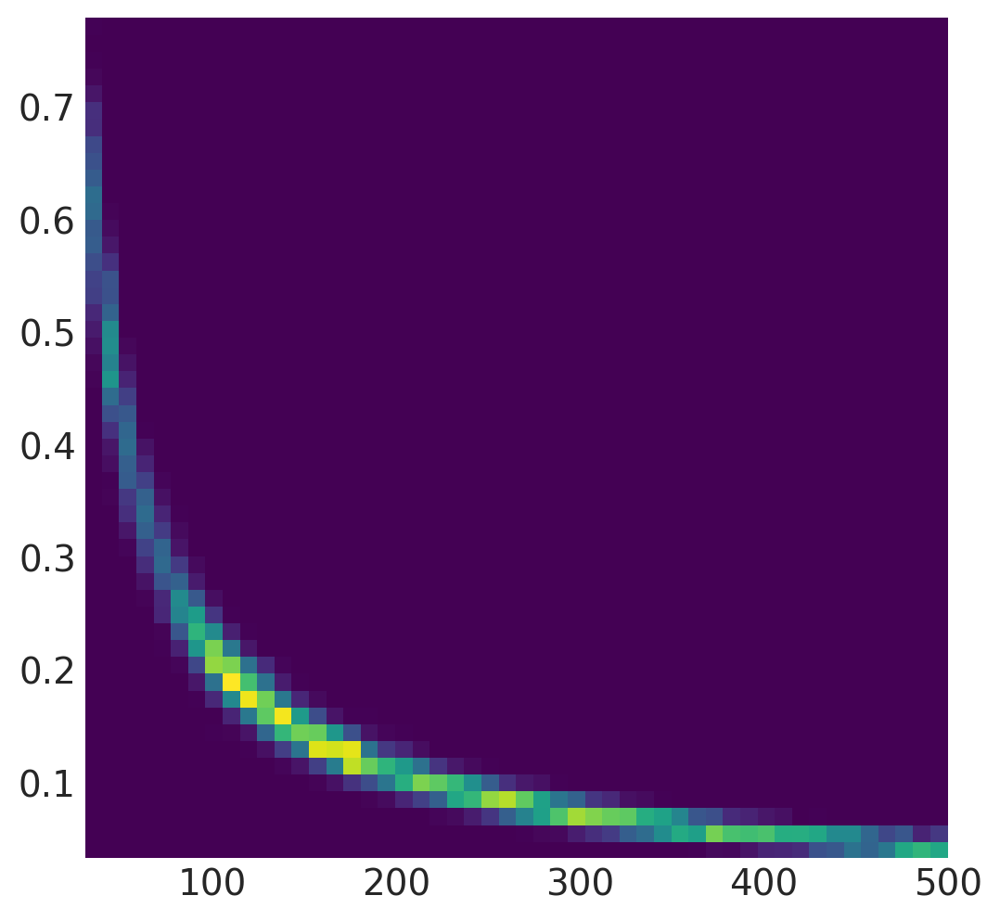

In [17]:
plt.figure(1, figsize=(6, 6))
plt.hist2d(npost, thetapost, bins=50, cmap="viridis");

### Note from Junpeng Lao
It is obvious from the above posterior plot that the geometry of the posterior is quite nasty. We can see that in the trace as well: the mixing is quite poor, with strong autocorrelation. There is no divergence warning, but it could just be that PyMC is mixing Metropolis and NUTS together due to the discrete variable. 

In this particular case, it is not a big deal as we can visualize the posterior directly. However, when we are sampling larger models, it is definitely going to be a problem.
Actually, we don't necessary need to use `DiscreteUniform` for `TotalN`, as the computation of logp in Binomial doesn't require n to be an integer.

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [TotalN, theta]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 6 seconds.
There were 104 divergences after tuning. Increase `target_accept` or reparameterize.
There were 73 divergences after tuning. Increase `target_accept` or reparameterize.
There were 97 divergences after tuning. Increase `target_accept` or reparameterize.
There were 83 divergences after tuning. Increase `target_accept` or reparameterize.
The number of effective samples is smaller than 10% for some parameters.


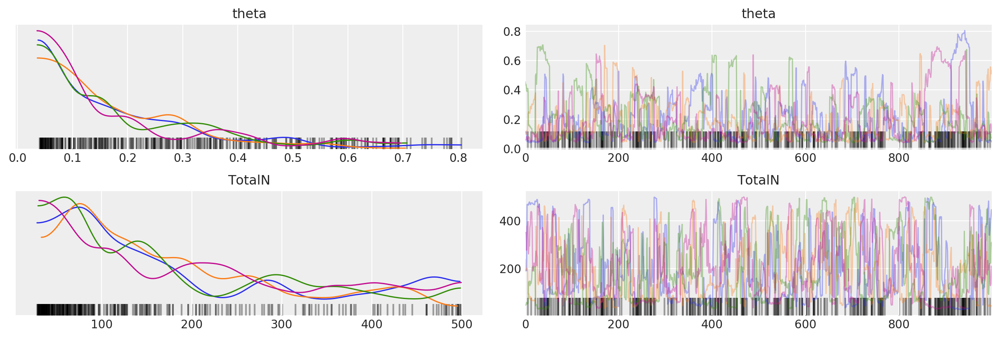

In [18]:
with pm.Model() as model6_:
    # prior
    theta = pm.Beta("theta", alpha=1, beta=1)
    TotalN = pm.Uniform("TotalN", lower=1, upper=nmax)
    # observed
    x = pm.Binomial("x", n=TotalN, p=theta, observed=k)
    # inference
    trace6_ = pm.sample()

idata6_ = az.from_pymc3(trace6_)
az.plot_trace(idata6_);

Not too surprisingly, we can see divergence warnings. We can further visualize them:

Number of divergences: 357
Percentage of divergent samples: 35.70


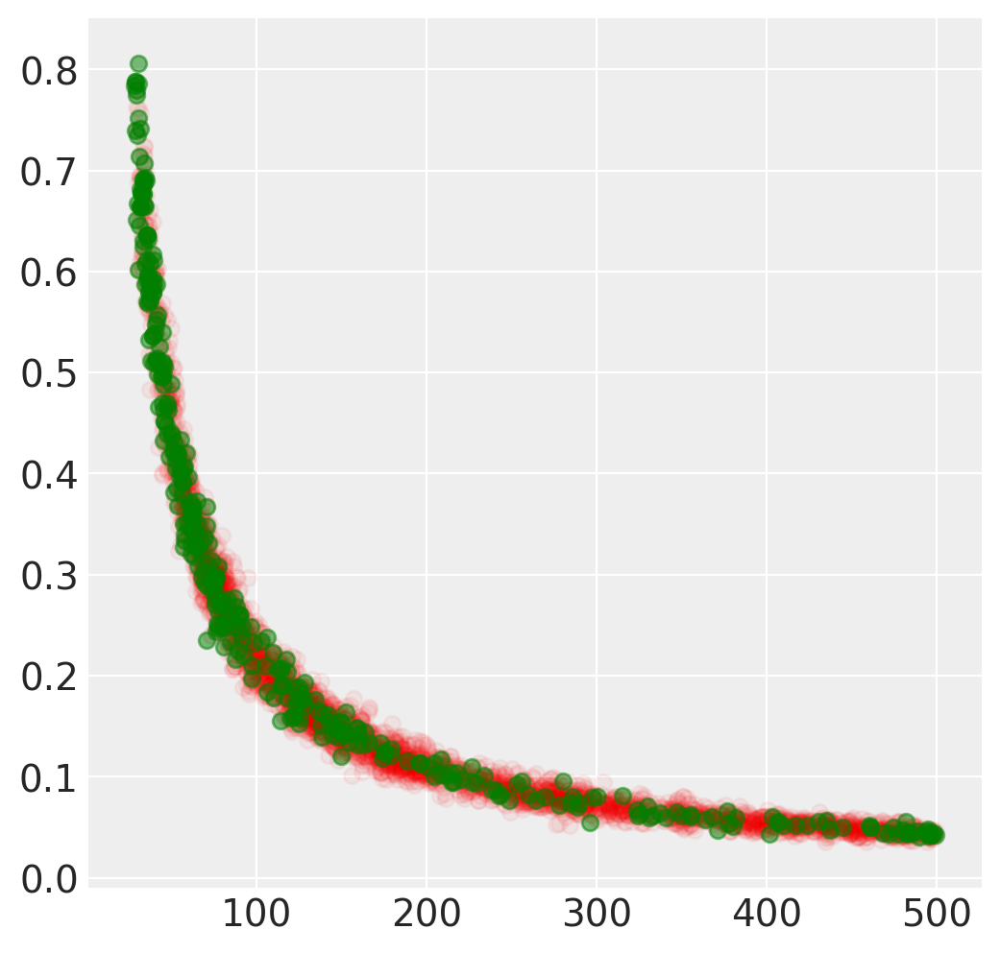

In [19]:
# display the total number and percentage of divergences
divergent = trace6_["diverging"]
print("Number of divergences: %d" % divergent.nonzero()[0].size)
divperc = divergent.nonzero()[0].size * 100 / len(trace6_)
print("Percentage of divergent samples: %.2f" % divperc)

# scatter plot between theta and N
# for the identifcation of the problematic neighborhoods in parameter space
theta_tr = trace6_["theta"]
totaln_tr = trace6_["TotalN"]
plt.figure(figsize=(6, 6))
plt.scatter(totaln_tr[divergent == 0], theta_tr[divergent == 0], color="r", alpha=0.05)
plt.scatter(totaln_tr[divergent == 1], theta_tr[divergent == 1], color="g", alpha=0.5);

It confirms our intuition that in the high curvature area (tails), our sampler is going to have difficulties.

In [20]:
%load_ext watermark
%watermark -n -u -v -iv -w

pandas  1.0.3
numpy   1.18.1
arviz   0.7.0
seaborn 0.10.0
pymc   3.8
last updated: Fri Apr 24 2020 

CPython 3.7.7
IPython 7.13.0
watermark 2.0.2
